# Aim: Predict Real Power Consumption usage a Linear Regression Model 

Definition of active power: Usable or consumable energy in an AC Circuit (in the form of KW)

Looking at the Attribute information, the Usage_kWh contains the industry energy consumption in kWh. Since usage_kWh reflects the real power consumption, it is directly associate with the active current component. Therefore we want to center our analysis around this field. 

<b>Assumption:</b> Variables associated to date and times affect power consumption patterns. We assume that the energy consumption will vary depending on the weekday or time of the dat.

# Data Cleaning

In [304]:
import pandas as pd
import numpy as np

In [305]:
df = pd.read_csv(r'C:\Users\U355394\Desktop\Steel_industry_data.csv')

Printing out the columns

To further elaborate on the initial assumptions, power factor fields will be useful. since they highluight the ratio of active power to apparent power in a circuit. In other words, they help us check if the electrical power is being used effectively.

In [306]:
df.columns

Index(['date', 'Usage_kWh', 'Lagging_Current_Reactive.Power_kVarh',
       'Leading_Current_Reactive_Power_kVarh', 'CO2(tCO2)',
       'Lagging_Current_Power_Factor', 'Leading_Current_Power_Factor', 'NSM',
       'WeekStatus', 'Day_of_week', 'Load_Type'],
      dtype='object')

Let's drop the 

Let's rename them for better clarity

In [307]:
# Define the mapping of old column names to new column names
column_mapping = {
    'date': 'Date',
    'Usage_kWh': 'Active_Power_kWh',
    'Lagging_Current_Reactive.Power_kVarh': 'Lagging_Reactive_Power_kVarh',
    'Leading_Current_Reactive_Power_kVarh': 'Leading_Reactive_Power_kVarh',
    'CO2(tCO2)': 'CO2_tCO2',
    'Lagging_Current_Power_Factor': 'Lagging_Power_Factor',
    'Leading_Current_Power_Factor': 'Leading_Power_Factor',
    'NSM': 'Seconds_From_Midnight',
    'WeekStatus': 'Week_Status',
    'Day_of_week': 'Day_of_Week',
    'Load_Type': 'Load_Type'
}

# Rename the columns
df.rename(columns=column_mapping, inplace=True)

# Verify the changes
df.head()

,Date,Active_Power_kWh,Lagging_Reactive_Power_kVarh,Leading_Reactive_Power_kVarh,CO2_tCO2,Lagging_Power_Factor,Leading_Power_Factor,Seconds_From_Midnight,Week_Status,Day_of_Week,Load_Type
0,01/01/2018 00:15,3.17,2.95,0.0,0.0,73.21,100.0,900,Weekday,Monday,Light_Load
1,01/01/2018 00:30,4.00,4.46,0.0,0.0,66.77,100.0,1800,Weekday,Monday,Light_Load
2,01/01/2018 00:45,3.24,3.28,0.0,0.0,70.28,100.0,2700,Weekday,Monday,Light_Load
3,01/01/2018 01:00,3.31,3.56,0.0,0.0,68.09,100.0,3600,Weekday,Monday,Light_Load
4,01/01/2018 01:15,3.82,4.50,0.0,0.0,64.72,100.0,4500,Weekday,Monday,Light_Load


Drop the index column:

In [308]:
df.reset_index(drop=True, inplace=True) 
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35040 entries, 0 to 35039
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Date                          35040 non-null  object 
 1   Active_Power_kWh              35040 non-null  float64
 2   Lagging_Reactive_Power_kVarh  35040 non-null  float64
 3   Leading_Reactive_Power_kVarh  35040 non-null  float64
 4   CO2_tCO2                      35040 non-null  float64
 5   Lagging_Power_Factor          35040 non-null  float64
 6   Leading_Power_Factor          35040 non-null  float64
 7   Seconds_From_Midnight         35040 non-null  int64  
 8   Week_Status                   35040 non-null  object 
 9   Day_of_Week                   35040 non-null  object 
 10  Load_Type                     35040 non-null  object 
dtypes: float64(6), int64(1), object(4)
memory usage: 2.9+ MB


In [309]:
df.shape

(35040, 11)

Check duplicated rows:

In [310]:
# Check for duplicated rows
duplicate_rows = df[df.duplicated()]

# Print the duplicated rows
print("Duplicated Rows:")
print(duplicate_rows)

Duplicated Rows:
Empty DataFrame
Columns: [Date, Active_Power_kWh, Lagging_Reactive_Power_kVarh, Leading_Reactive_Power_kVarh, CO2_tCO2, Lagging_Power_Factor, Leading_Power_Factor, Seconds_From_Midnight, Week_Status, Day_of_Week, Load_Type]
Index: []


We do not find any missing values

In [311]:
# Handling Missing Values:
#Check if there is missing value 
df.isnull().sum().sort_values(ascending=False)

Date                            0
Active_Power_kWh                0
Lagging_Reactive_Power_kVarh    0
Leading_Reactive_Power_kVarh    0
CO2_tCO2                        0
Lagging_Power_Factor            0
Leading_Power_Factor            0
Seconds_From_Midnight           0
Week_Status                     0
Day_of_Week                     0
Load_Type                       0
dtype: int64

Summary statistics:

In [312]:
#Summary statistics of the datase
df.describe()

,Active_Power_kWh,Lagging_Reactive_Power_kVarh,Leading_Reactive_Power_kVarh,CO2_tCO2,Lagging_Power_Factor,Leading_Power_Factor,Seconds_From_Midnight
count,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000,35040.000000
mean,27.386892,13.035384,3.870949,0.011524,80.578056,84.367870,42750.000000
std,33.444380,16.306000,7.424463,0.016151,18.921322,30.456535,24940.534317
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.200000,2.300000,0.000000,0.000000,63.320000,99.700000,21375.000000
50%,4.570000,5.000000,0.000000,0.000000,87.960000,100.000000,42750.000000
75%,51.237500,22.640000,2.090000,0.020000,99.022500,100.000000,64125.000000
max,157.180000,96.910000,27.760000,0.070000,100.000000,100.000000,85500.000000


Convert date to datetime format, create columns for day, month, year:

In [313]:
df['Day'] = pd.to_datetime(df['Date'], dayfirst=True).dt.day
df['Month'] = pd.to_datetime(df['Date'], dayfirst=True).dt.month
df['Year'] = pd.to_datetime(df['Date'], dayfirst=True).dt.year
df['Time'] = pd.to_datetime(df['Date'], dayfirst=True).dt.time
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True).dt.date
#df['Seconds'] = df['Date'].dt.second
df.columns

Index(['Date', 'Active_Power_kWh', 'Lagging_Reactive_Power_kVarh',
       'Leading_Reactive_Power_kVarh', 'CO2_tCO2', 'Lagging_Power_Factor',
       'Leading_Power_Factor', 'Seconds_From_Midnight', 'Week_Status',
       'Day_of_Week', 'Load_Type', 'Day', 'Month', 'Year', 'Time'],
      dtype='object')

In [314]:
df.head()

,Date,Active_Power_kWh,Lagging_Reactive_Power_kVarh,Leading_Reactive_Power_kVarh,CO2_tCO2,Lagging_Power_Factor,Leading_Power_Factor,Seconds_From_Midnight,Week_Status,Day_of_Week,Load_Type,Day,Month,Year,Time
0,2018-01-01,3.17,2.95,0.0,0.0,73.21,100.0,900,Weekday,Monday,Light_Load,1,1,2018,00:15:00
1,2018-01-01,4.00,4.46,0.0,0.0,66.77,100.0,1800,Weekday,Monday,Light_Load,1,1,2018,00:30:00
2,2018-01-01,3.24,3.28,0.0,0.0,70.28,100.0,2700,Weekday,Monday,Light_Load,1,1,2018,00:45:00
3,2018-01-01,3.31,3.56,0.0,0.0,68.09,100.0,3600,Weekday,Monday,Light_Load,1,1,2018,01:00:00
4,2018-01-01,3.82,4.50,0.0,0.0,64.72,100.0,4500,Weekday,Monday,Light_Load,1,1,2018,01:15:00


In [315]:
df

,Date,Active_Power_kWh,Lagging_Reactive_Power_kVarh,Leading_Reactive_Power_kVarh,CO2_tCO2,Lagging_Power_Factor,Leading_Power_Factor,Seconds_From_Midnight,Week_Status,Day_of_Week,Load_Type,Day,Month,Year,Time
0,2018-01-01,3.17,2.95,0.00,0.0,73.21,100.00,900,Weekday,Monday,Light_Load,1,1,2018,00:15:00
1,2018-01-01,4.00,4.46,0.00,0.0,66.77,100.00,1800,Weekday,Monday,Light_Load,1,1,2018,00:30:00
2,2018-01-01,3.24,3.28,0.00,0.0,70.28,100.00,2700,Weekday,Monday,Light_Load,1,1,2018,00:45:00
3,2018-01-01,3.31,3.56,0.00,0.0,68.09,100.00,3600,Weekday,Monday,Light_Load,1,1,2018,01:00:00
4,2018-01-01,3.82,4.50,0.00,0.0,64.72,100.00,4500,Weekday,Monday,Light_Load,1,1,2018,01:15:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35035,2018-12-31,3.85,4.86,0.00,0.0,62.10,100.00,82800,Weekday,Monday,Light_Load,31,12,2018,23:00:00
35036,2018-12-31,3.74,3.74,0.00,0.0,70.71,100.00,83700,Weekday,Monday,Light_Load,31,12,2018,23:15:00
35037,2018-12-31,3.78,3.17,0.07,0.0,76.62,99.98,84600,Weekday,Monday,Light_Load,31,12,2018,23:30:00
35038,2018-12-31,3.78,3.06,0.11,0.0,77.72,99.96,85500,Weekday,Monday,Light_Load,31,12,2018,23:45:00


In [316]:
df.dtypes

Date                             object
Active_Power_kWh                float64
Lagging_Reactive_Power_kVarh    float64
Leading_Reactive_Power_kVarh    float64
CO2_tCO2                        float64
Lagging_Power_Factor            float64
Leading_Power_Factor            float64
Seconds_From_Midnight             int64
Week_Status                      object
Day_of_Week                      object
Load_Type                        object
Day                               int32
Month                             int32
Year                              int32
Time                             object
dtype: object

Outlier Detection for outliers; Leading power variables showcase very strong skewness, and a lot of outliers.

In [317]:
from plotly.subplots import make_subplots
import plotly.express as px

# Identify numeric columns excluding 'Date', 'Month', 'Day', and 'Year'
date_cols = ['Date', 'Month', 'Day', 'Year']
numeric_cols = [col for col in df.columns if np.issubdtype(df[col].dtype, np.number) and col not in date_cols]
#Detect the outliers 
fig = make_subplots(rows=len(numeric_cols), cols=1, subplot_titles=numeric_cols)

for i, feature in enumerate(numeric_cols):
    boxplot = px.box(df, y=feature, title=f'Boxplot of {feature}')
    # Add boxplot to subplots
    for data in boxplot.data:
        fig.add_trace(data, row=i+1, col=1)

fig.update_layout(height=200*len(numeric_cols), showlegend=False)

fig.show() 

We remove outliers according to normality of distribution: if the column is highly skewed, appy the IQR method which is appropriate for non-normal distributions

In [318]:
numeric_cols

['Active_Power_kWh',
 'Lagging_Reactive_Power_kVarh',
 'Leading_Reactive_Power_kVarh',
 'CO2_tCO2',
 'Lagging_Power_Factor',
 'Leading_Power_Factor',
 'Seconds_From_Midnight']

In [319]:
def remove_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

for col in numeric_cols:
    if df[col].skew() > 1 or df[col].skew() < -1:
        df = remove_outliers_iqr(df, col)


df.shape
df

,Date,Active_Power_kWh,Lagging_Reactive_Power_kVarh,Leading_Reactive_Power_kVarh,CO2_tCO2,Lagging_Power_Factor,Leading_Power_Factor,Seconds_From_Midnight,Week_Status,Day_of_Week,Load_Type,Day,Month,Year,Time
0,2018-01-01,3.17,2.95,0.0,0.0,73.21,100.0,900,Weekday,Monday,Light_Load,1,1,2018,00:15:00
1,2018-01-01,4.00,4.46,0.0,0.0,66.77,100.0,1800,Weekday,Monday,Light_Load,1,1,2018,00:30:00
2,2018-01-01,3.24,3.28,0.0,0.0,70.28,100.0,2700,Weekday,Monday,Light_Load,1,1,2018,00:45:00
3,2018-01-01,3.31,3.56,0.0,0.0,68.09,100.0,3600,Weekday,Monday,Light_Load,1,1,2018,01:00:00
4,2018-01-01,3.82,4.50,0.0,0.0,64.72,100.0,4500,Weekday,Monday,Light_Load,1,1,2018,01:15:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34971,2018-12-31,3.74,3.02,0.0,0.0,77.80,100.0,25200,Weekday,Monday,Light_Load,31,12,2018,07:00:00
35033,2018-12-31,3.67,4.43,0.0,0.0,63.80,100.0,81000,Weekday,Monday,Light_Load,31,12,2018,22:30:00
35034,2018-12-31,3.82,4.54,0.0,0.0,64.38,100.0,81900,Weekday,Monday,Light_Load,31,12,2018,22:45:00
35035,2018-12-31,3.85,4.86,0.0,0.0,62.10,100.0,82800,Weekday,Monday,Light_Load,31,12,2018,23:00:00


In [320]:
# Create subplots for each numeric column
fig = make_subplots(rows=len(numeric_cols), cols=1, subplot_titles=numeric_cols)

for i, feature in enumerate(numeric_cols):
    boxplot = px.box(df, y=feature, title=f'Boxplot of {feature}')
    # Add boxplot to subplots
    for data in boxplot.data:
        fig.add_trace(data, row=i+1, col=1)

fig.update_layout(height=200*len(numeric_cols), showlegend=False)

fig.show()

Importing data to identify holidays:

In [321]:
day_off = pd.read_excel(r'C:\Users\U355394\Desktop\Day_off.xlsx', index_col=None, header=None)
day_off = day_off.rename(columns={0: 'Date'}).copy()
day_off['Holiday'] = 0
day_off['Date'] = pd.to_datetime(day_off['Date']).dt.date
day_off.sort_values(by=['Date'])
day_off.drop([1,2,3,4,5,7,8,9,10,11])
day_off

,Date,Holiday
0,2018-01-01,0
1,2018-01-15,0
2,2018-01-16,0
3,2018-01-17,0
4,2018-01-03,0
5,2018-05-05,0
6,2018-05-22,0
7,2018-06-06,0
8,2018-06-13,0
9,2018-08-15,0


Identifying daily usage of Active Power and merge it:

In [322]:
q = df.groupby(['Date'])['Active_Power_kWh'].sum().reset_index()
q['day_usage'] = q['Active_Power_kWh']
q = q.drop(columns=['Active_Power_kWh'])

In [323]:
df = pd.merge(df, q, on='Date', how='left')
df = pd.merge(df, day_off, on='Date', how='left').fillna(1)
df.head(5)

,Date,Active_Power_kWh,Lagging_Reactive_Power_kVarh,Leading_Reactive_Power_kVarh,CO2_tCO2,Lagging_Power_Factor,Leading_Power_Factor,Seconds_From_Midnight,Week_Status,Day_of_Week,Load_Type,Day,Month,Year,Time,day_usage,Holiday
0,2018-01-01,3.17,2.95,0.0,0.0,73.21,100.0,900,Weekday,Monday,Light_Load,1,1,2018,00:15:00,143.11,0.0
1,2018-01-01,4.00,4.46,0.0,0.0,66.77,100.0,1800,Weekday,Monday,Light_Load,1,1,2018,00:30:00,143.11,0.0
2,2018-01-01,3.24,3.28,0.0,0.0,70.28,100.0,2700,Weekday,Monday,Light_Load,1,1,2018,00:45:00,143.11,0.0
3,2018-01-01,3.31,3.56,0.0,0.0,68.09,100.0,3600,Weekday,Monday,Light_Load,1,1,2018,01:00:00,143.11,0.0
4,2018-01-01,3.82,4.50,0.0,0.0,64.72,100.0,4500,Weekday,Monday,Light_Load,1,1,2018,01:15:00,143.11,0.0


Previous Day Usage:

In [324]:
df['previous_day_Usage_kWh'] = df['day_usage'].shift(96).fillna(84.77)
df

,Date,Active_Power_kWh,Lagging_Reactive_Power_kVarh,Leading_Reactive_Power_kVarh,CO2_tCO2,Lagging_Power_Factor,Leading_Power_Factor,Seconds_From_Midnight,Week_Status,Day_of_Week,Load_Type,Day,Month,Year,Time,day_usage,Holiday,previous_day_Usage_kWh
0,2018-01-01,3.17,2.95,0.0,0.0,73.21,100.0,900,Weekday,Monday,Light_Load,1,1,2018,00:15:00,143.11,0.0,84.77
1,2018-01-01,4.00,4.46,0.0,0.0,66.77,100.0,1800,Weekday,Monday,Light_Load,1,1,2018,00:30:00,143.11,0.0,84.77
2,2018-01-01,3.24,3.28,0.0,0.0,70.28,100.0,2700,Weekday,Monday,Light_Load,1,1,2018,00:45:00,143.11,0.0,84.77
3,2018-01-01,3.31,3.56,0.0,0.0,68.09,100.0,3600,Weekday,Monday,Light_Load,1,1,2018,01:00:00,143.11,0.0,84.77
4,2018-01-01,3.82,4.50,0.0,0.0,64.72,100.0,4500,Weekday,Monday,Light_Load,1,1,2018,01:15:00,143.11,0.0,84.77
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23083,2018-12-31,3.74,3.02,0.0,0.0,77.80,100.0,25200,Weekday,Monday,Light_Load,31,12,2018,07:00:00,22.46,1.0,2112.99
23084,2018-12-31,3.67,4.43,0.0,0.0,63.80,100.0,81000,Weekday,Monday,Light_Load,31,12,2018,22:30:00,22.46,1.0,2112.99
23085,2018-12-31,3.82,4.54,0.0,0.0,64.38,100.0,81900,Weekday,Monday,Light_Load,31,12,2018,22:45:00,22.46,1.0,2112.99
23086,2018-12-31,3.85,4.86,0.0,0.0,62.10,100.0,82800,Weekday,Monday,Light_Load,31,12,2018,23:00:00,22.46,1.0,2112.99


# Data Analysis

In [325]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

We find very strong collinearity between CO2 and Active Power

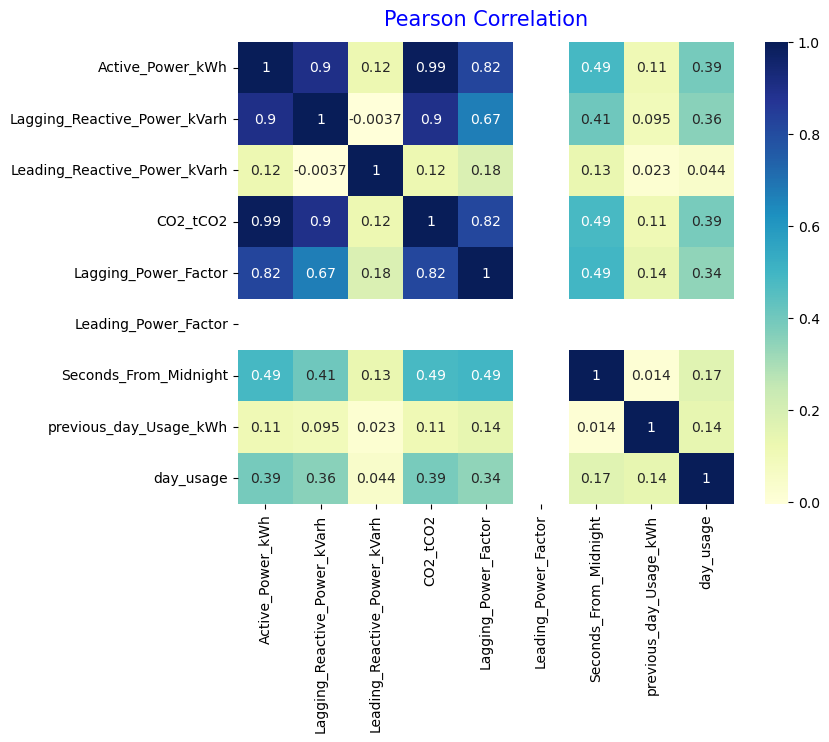

In [326]:
import seaborn as sns
import matplotlib.pyplot as plt
num_df = df.loc[:,['Active_Power_kWh',
 'Lagging_Reactive_Power_kVarh',
 'Leading_Reactive_Power_kVarh',
 'CO2_tCO2',
 'Lagging_Power_Factor',
 'Leading_Power_Factor',
 'Seconds_From_Midnight', 'previous_day_Usage_kWh', 'day_usage']]

#visualize the correlation using pearson correlation
plt.figure(figsize = (8,6))
sns.heatmap(num_df.corr(), annot = True, cmap = 'YlGnBu')
plt.title("Pearson Correlation", fontsize = 15, color = 'b', pad = 12, loc = 'center')
plt.show()

In [327]:
df.columns

Index(['Date', 'Active_Power_kWh', 'Lagging_Reactive_Power_kVarh',
       'Leading_Reactive_Power_kVarh', 'CO2_tCO2', 'Lagging_Power_Factor',
       'Leading_Power_Factor', 'Seconds_From_Midnight', 'Week_Status',
       'Day_of_Week', 'Load_Type', 'Day', 'Month', 'Year', 'Time', 'day_usage',
       'Holiday', 'previous_day_Usage_kWh'],
      dtype='object')

Day with highest average Active Power Consumption; we find that Tuesday has the highest average Active Power consumption, and Sunday has the lowest average Active Consumption

In [328]:
avg_AC_by_day = df.groupby('Day_of_Week')['Active_Power_kWh'].mean()
avg_AC_by_day.iplot(kind='bar', title='Average Active Power consumption by Day of the Week', xTitle='Day of Week (Encoded)', yTitle='Average Active_Power_kWh')

Average Active Power Consumption by Week Status; Weekdays have a higher average Active Power Consumption than Weekends

In [329]:
# Bar Plot
df[['Week_Status', 'Active_Power_kWh']].groupby('Week_Status').mean().iplot(kind='bar', title='Average Usage kWh by Week Status')

The majority of load types are Light Loads. Loadd type classifications correspond to the demand in energy consumption. The higher the use of electrical devices, the higher the load type. These are crucial for energy management 

In [330]:
import plotly.graph_objects as go

# Count the occurrences of each load type
load_type_counts = df['Load_Type'].value_counts()

# Create the pie chart
fig = go.Figure(data=[go.Pie(labels=load_type_counts.index, values=load_type_counts.values)])
fig.update_layout(title='Distribution of Load Types')
fig.show()

January has the highest average Active Power Consumption

In [331]:
# Analyze the most energy consumption based on time
most_energy_consumption = pd.pivot_table(df, index='Month', values='Active_Power_kWh', aggfunc=np.mean)

# Create a line plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=most_energy_consumption.index,
    y=most_energy_consumption['Active_Power_kWh'],
    mode='lines+markers',
    name='Active Power Consumption'
))

# Update layout to display each month on the x-axis
fig.update_layout(
    title='Average Active Power Consumption by Month',
    xaxis_title='Month',
    yaxis_title='Average Active Power Consumption (kWh)',
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(1, 13)),
        ticktext=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
    ),
    template='plotly'
)

fig.show()

In [332]:
df.columns

Index(['Date', 'Active_Power_kWh', 'Lagging_Reactive_Power_kVarh',
       'Leading_Reactive_Power_kVarh', 'CO2_tCO2', 'Lagging_Power_Factor',
       'Leading_Power_Factor', 'Seconds_From_Midnight', 'Week_Status',
       'Day_of_Week', 'Load_Type', 'Day', 'Month', 'Year', 'Time', 'day_usage',
       'Holiday', 'previous_day_Usage_kWh'],
      dtype='object')

While January has a far higher average maximum Active Power Usage for Light Loads, February has a higher average consumption of Active Power for Maximum Load types. This indicates that for any load types, Winter season will have a higher Energy Consumption.

In [333]:
# Define a function to create the line plot for a given load type
def plot_load_type(load_type):
    # Filter the DataFrame for the specified load type
    df_load = df[df['Load_Type'] == load_type]
    
    # Calculate the monthly average active power consumption
    monthly_avg = df_load.groupby('Month')['Active_Power_kWh'].mean()
    
    # Create the line plot
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=monthly_avg.index,
        y=monthly_avg.values,
        mode='lines+markers',
        name=f'Active Power Consumption - {load_type}'
    ))
    
    # Update layout to display each month on the x-axis
    fig.update_layout(
        title=f'Average Active Power Consumption by Month for {load_type.replace("_", " ")}',
        xaxis_title='Month',
        yaxis_title='Average Active Power Consumption (kWh)',
        xaxis=dict(
            tickmode='array',
            tickvals=list(range(1, 13)),
            ticktext=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
        ),
        template='plotly',
        width=1000,  # Adjust width as needed
        height=400   # Adjust height as needed
    )
    fig.show()

# Plot for Light Load
plot_load_type('Light_Load')

# Plot for Medium Load
plot_load_type('Medium_Load')

# Plot for Maximum Load
plot_load_type('Maximum_Load')

In [334]:
df.head()

,Date,Active_Power_kWh,Lagging_Reactive_Power_kVarh,Leading_Reactive_Power_kVarh,CO2_tCO2,Lagging_Power_Factor,Leading_Power_Factor,Seconds_From_Midnight,Week_Status,Day_of_Week,Load_Type,Day,Month,Year,Time,day_usage,Holiday,previous_day_Usage_kWh
0,2018-01-01,3.17,2.95,0.0,0.0,73.21,100.0,900,Weekday,Monday,Light_Load,1,1,2018,00:15:00,143.11,0.0,84.77
1,2018-01-01,4.00,4.46,0.0,0.0,66.77,100.0,1800,Weekday,Monday,Light_Load,1,1,2018,00:30:00,143.11,0.0,84.77
2,2018-01-01,3.24,3.28,0.0,0.0,70.28,100.0,2700,Weekday,Monday,Light_Load,1,1,2018,00:45:00,143.11,0.0,84.77
3,2018-01-01,3.31,3.56,0.0,0.0,68.09,100.0,3600,Weekday,Monday,Light_Load,1,1,2018,01:00:00,143.11,0.0,84.77
4,2018-01-01,3.82,4.50,0.0,0.0,64.72,100.0,4500,Weekday,Monday,Light_Load,1,1,2018,01:15:00,143.11,0.0,84.77


Bar Plot of average Consumption of Active Power kWh in a holiday versus non holiday date - Average energy consumption during holidays tend to be higher than non-holidays

In [335]:
df.groupby('Holiday')['Active_Power_kWh'].mean().reset_index()

,Holiday,Active_Power_kWh
0,0.0,22.539202
1,1.0,30.705383


In [336]:
# Group by 'Holiday' and calculate mean of 'Active_Power_kWh'
df_grouped = df.groupby('Holiday')['Active_Power_kWh'].mean().reset_index()

# Create bar plot
fig = px.bar(df_grouped, x='Holiday', y='Active_Power_kWh', title='Average Usage kWh by Holiday Status')

fig.update_layout(
    xaxis=dict(
        tickmode='array',
        tickvals=[0, 1],
        ticktext=['Non-Holiday', 'Holiday']
    )
)
# Show plot
fig.show()

Table showing the highest average active power consumption according to the load type, day of the week, week status association

In [337]:
df.columns

Index(['Date', 'Active_Power_kWh', 'Lagging_Reactive_Power_kVarh',
       'Leading_Reactive_Power_kVarh', 'CO2_tCO2', 'Lagging_Power_Factor',
       'Leading_Power_Factor', 'Seconds_From_Midnight', 'Week_Status',
       'Day_of_Week', 'Load_Type', 'Day', 'Month', 'Year', 'Time', 'day_usage',
       'Holiday', 'previous_day_Usage_kWh'],
      dtype='object')

In [338]:
pd.pivot_table(df, index = ['Load_Type', 'Day_of_Week', 'Week_Status', 'Holiday'], values = ['day_usage'], 
               aggfunc = {'day_usage' : np.max})

day_usage
Load_Type    Day_of_Week Week_Status Holiday           
Light_Load   Friday      Weekday     1.0        5940.72
             Monday      Weekday     0.0        2460.98
                                     1.0        3995.34
             Saturday    Weekend     0.0         135.57
                                     1.0        3866.34
             Sunday      Weekend     0.0         110.70
                                     1.0        2505.69
             Thursday    Weekday     1.0        4950.25
             Tuesday     Weekday     0.0        3259.22
                                     1.0        5052.03
             Wednesday   Weekday     0.0        2687.11
                                     1.0        4185.46
Maximum_Load Friday      Weekday     1.0        5940.72
             Monday      Weekday     0.0        2460.98
                                     1.0        3995.34
             Saturday    Weekend     1.0        3866.34
             Sunday      Weekend     1.0        2505.69
             Thursday    Weekday     1.0        4950.25
             Tuesday     Weekday     0.0        3259.22
                                     1.0        5052.03
             Wednesday   Weekday     0.0        2687.11
                                     1.0        4185.46
Medium_Load  Friday      Weekday     1.0        5940.72
             Monday      Weekday     0.0        2460.98
                                     1.0        3995.34
             Saturday    Weekend     0.0         135.57
                                     1.0        3866.34
             Sunday      Weekend     1.0        2505.69
             Thursday    Weekday     1.0        4950.25
             Tuesday     Weekday     0.0        3259.22
                                     1.0        5052.03
             Wednesday   Weekday     0.0        2687.11
                                     1.0        4185.46

We can look at the day of each month having the highest consumption in maximum load type. Create a barplot showing the most common day having the highest energy consumption of max load by month for instance

We can create a lineplot showing the evolution of energy consumption for the highest consuming day of the year

# Data Pre-Processing

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn import preprocessing
# Encode Categorical Columns
categ = df.select_dtypes(include = "object").columns

le = preprocessing.LabelEncoder()
df[categ] = df[categ].apply(le.fit_transform)

df.head()

,Date,Active_Power_kWh,Lagging_Reactive_Power_kVarh,Leading_Reactive_Power_kVarh,CO2_tCO2,Lagging_Power_Factor,Leading_Power_Factor,Seconds_From_Midnight,Week_Status,Day_of_Week,Load_Type,Day,Month,Year,Time,day_usage,Holiday,previous_day_Usage_kWh
0,0,3.17,2.95,0.0,0.0,73.21,100.0,900,0,1,0,1,1,2018,1,143.11,0.0,84.77
1,0,4.00,4.46,0.0,0.0,66.77,100.0,1800,0,1,0,1,1,2018,2,143.11,0.0,84.77
2,0,3.24,3.28,0.0,0.0,70.28,100.0,2700,0,1,0,1,1,2018,3,143.11,0.0,84.77
3,0,3.31,3.56,0.0,0.0,68.09,100.0,3600,0,1,0,1,1,2018,4,143.11,0.0,84.77
4,0,3.82,4.50,0.0,0.0,64.72,100.0,4500,0,1,0,1,1,2018,5,143.11,0.0,84.77


Let's check the correlations, now that we have pre-processed data to be in numerical format:

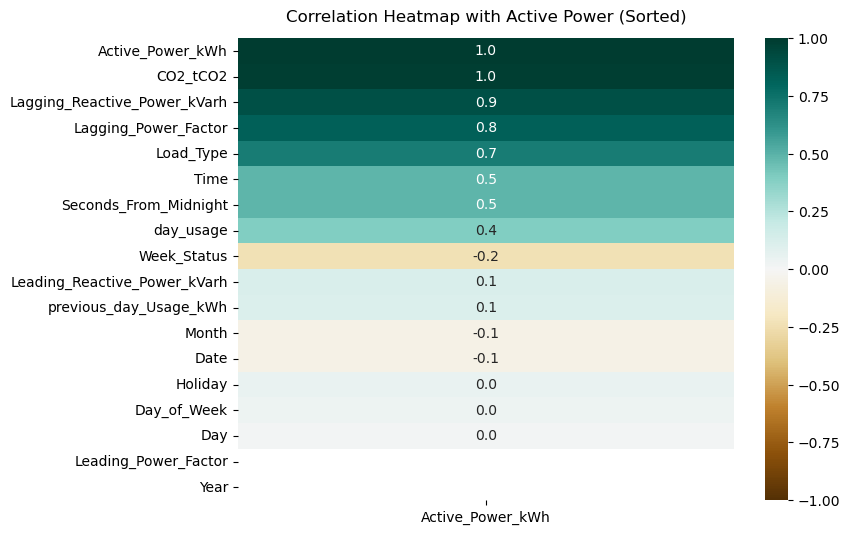

In [346]:
# Calculate the correlation matrix
corr_matrix = df.corr()

# Filter the correlation matrix to only show values correlated with 'Active_Power'
filtered_corr_matrix = corr_matrix[['Active_Power_kWh']]

# Sort the filtered correlation matrix by the absolute value of the correlation
filtered_corr_matrix = filtered_corr_matrix.reindex(filtered_corr_matrix['Active_Power_kWh'].abs().sort_values(ascending=False).index)

# Plot the heatmap of the filtered and sorted correlation matrix
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(filtered_corr_matrix, vmin=-1, vmax=1, annot=True, cmap='BrBG', fmt=".1f")
heatmap.set_title('Correlation Heatmap with Active Power (Sorted)', fontdict={'fontsize':12}, pad=12)
plt.show()

Let's remove those with high collinearity, or those with low correlation:

In [357]:
filtered_corr_matrix

,Active_Power_kWh
Lagging_Reactive_Power_kVarh,0.900994
Lagging_Power_Factor,0.823062
Load_Type,0.705952
Time,0.487724
Seconds_From_Midnight,0.487724


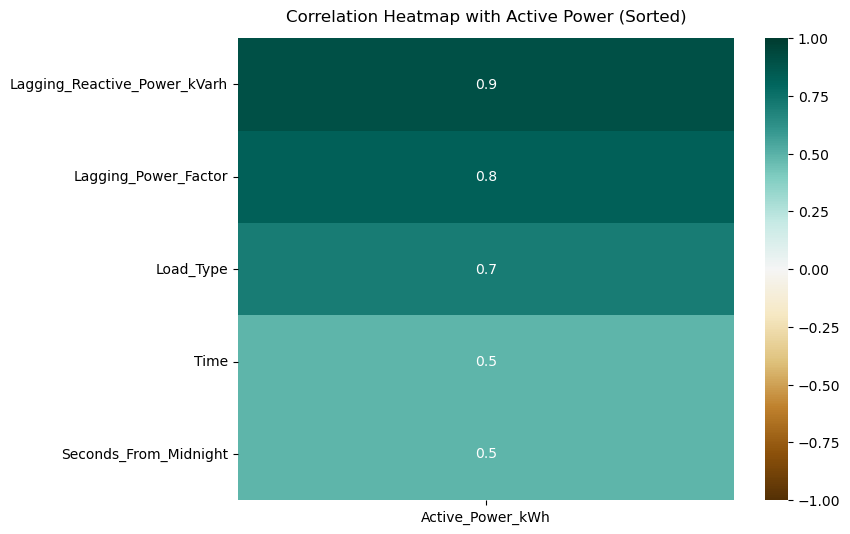

In [350]:
# Remove those that have 1 correlation coefficient in absolute value and those below 0.4 coefficient in absolute value
filtered_corr_matrix = filtered_corr_matrix[(filtered_corr_matrix['Active_Power_kWh'].abs() < 0.99) & (filtered_corr_matrix['Active_Power_kWh'].abs() >= 0.4)]
# Plot the heatmap of the filtered and sorted correlation matrix
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(filtered_corr_matrix, vmin=-1, vmax=1, annot=True, cmap='BrBG', fmt=".1f")
heatmap.set_title('Correlation Heatmap with Active Power (Sorted)', fontdict={'fontsize':12}, pad=12)
plt.show()

Checking normal distribution for Data Transformation - Left skewness might benefit from log or square root to make it normal and therefore reduce bias (for Lagging Power Factor), for active power and lagging reactive power for instance, we find right skewness ()

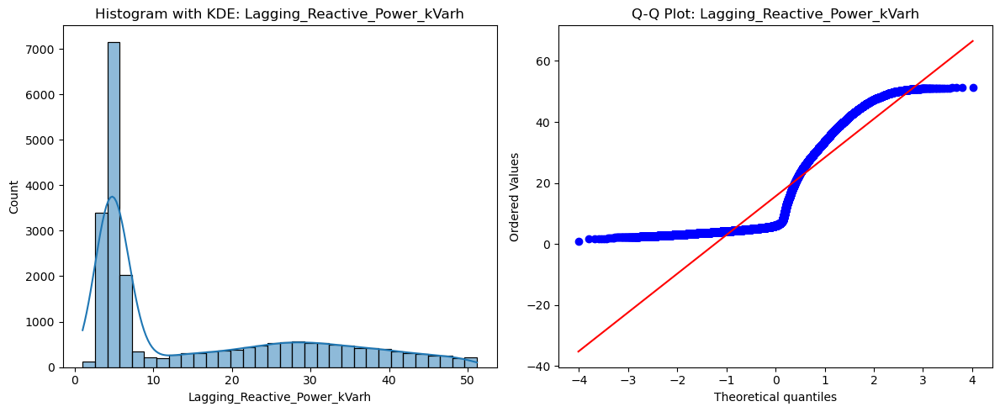

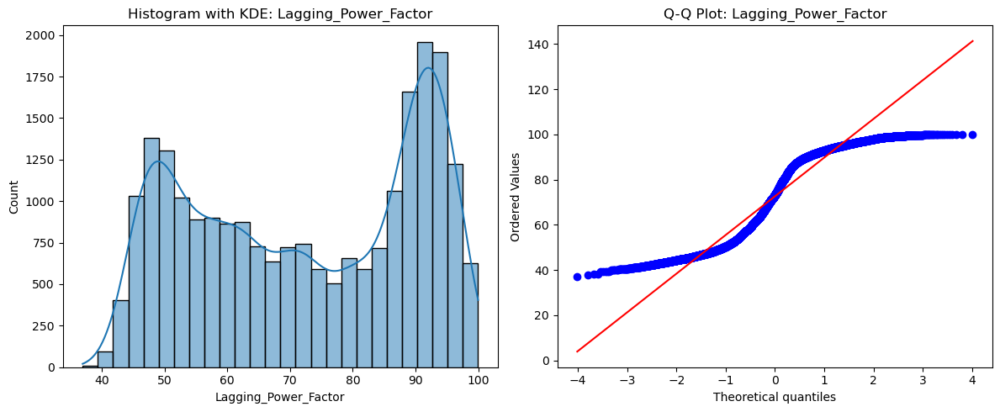

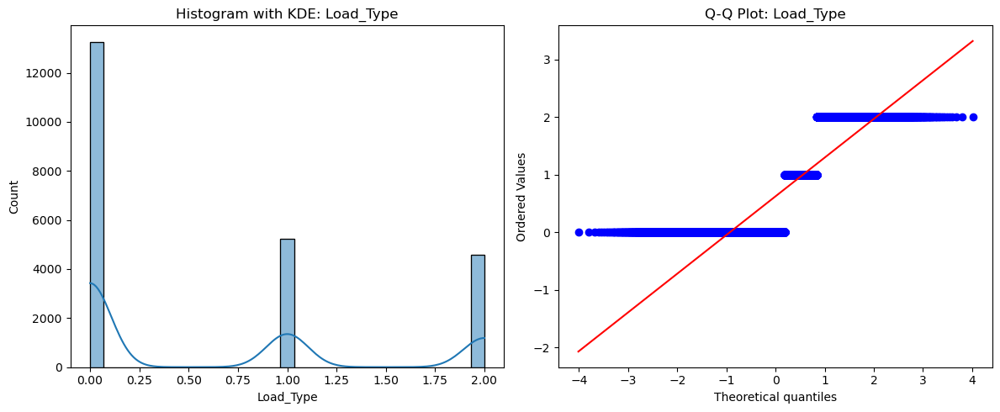

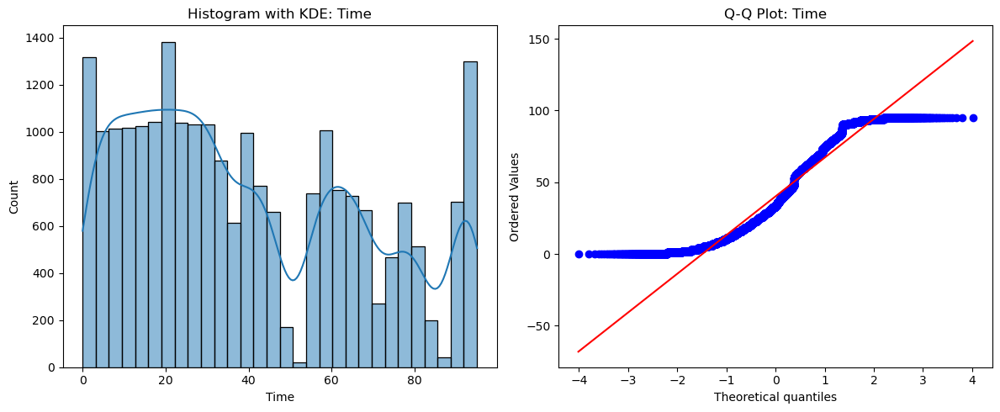

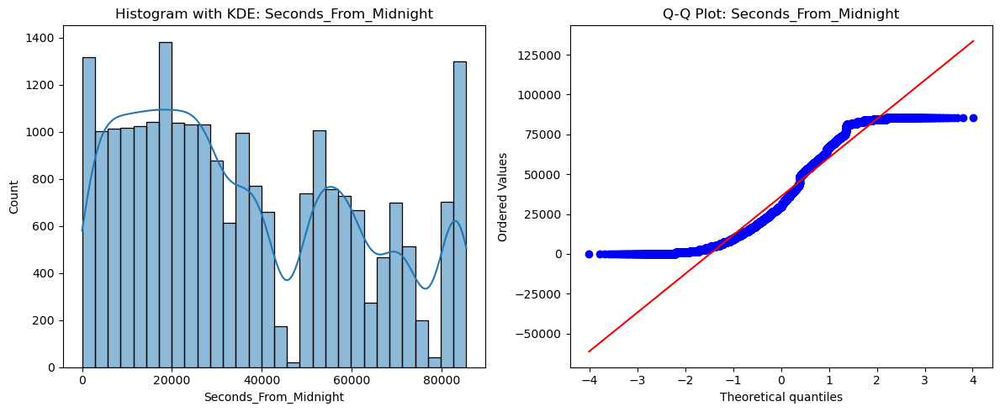

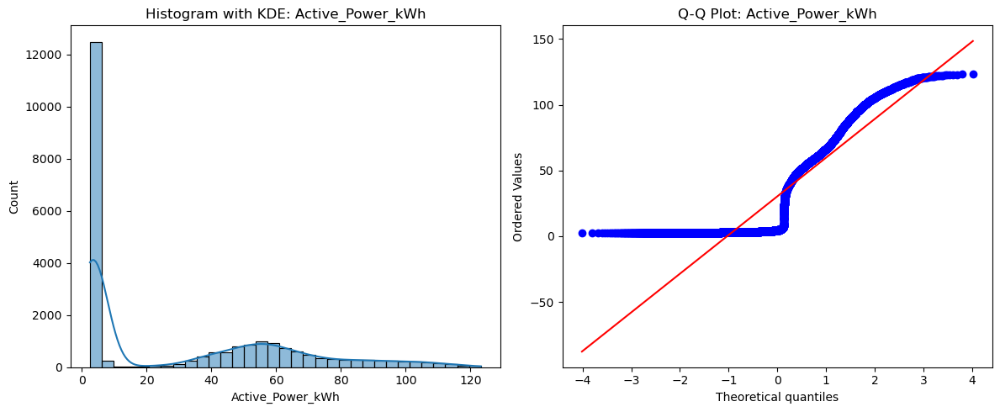

In [384]:
import scipy.stats as stats
df_new = df.copy()
df_new = df_new[['Lagging_Reactive_Power_kVarh', 'Lagging_Power_Factor', 'Load_Type',
        'Time', 'Seconds_From_Midnight', 'Active_Power_kWh']]
# Plot histograms and Q-Q plots for each continuous column

for column in df_new.columns:
    plt.figure(figsize=(12, 5))
    
    # Histogram with KDE
    plt.subplot(1, 2, 1)
    sns.histplot(df[column], kde=True)
    plt.title(f"Histogram with KDE: {column}")
    
    # Q-Q plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[column], dist="norm", plot=plt)
    plt.title(f"Q-Q Plot: {column}")
    
    plt.tight_layout()
    plt.show()

Applying log transformation:

In [377]:
df_new

,Lagging_Reactive_Power_kVarh,Lagging_Power_Factor,Load_Type,Time,Seconds_From_Midnight,Active_Power_kWh
0,0.864456,73.21,0.0,0.526589,6.803505,0.887033
1,0.992306,66.77,0.0,0.741276,7.496097,0.959135
2,0.897700,70.28,0.0,0.869742,7.901377,0.893866
3,0.923196,68.09,0.0,0.959135,8.188967,0.900543
4,0.995009,64.72,0.0,1.026672,8.412055,0.944985
...,...,...,...,...,...,...
23083,0.871830,77.80,0.0,1.474144,10.134639,0.938458
23084,0.990262,63.80,0.0,1.706721,11.302217,0.932620
23085,0.997684,64.38,0.0,1.708702,11.313266,0.944985
23086,1.018179,62.10,0.0,1.710658,11.324195,0.947393


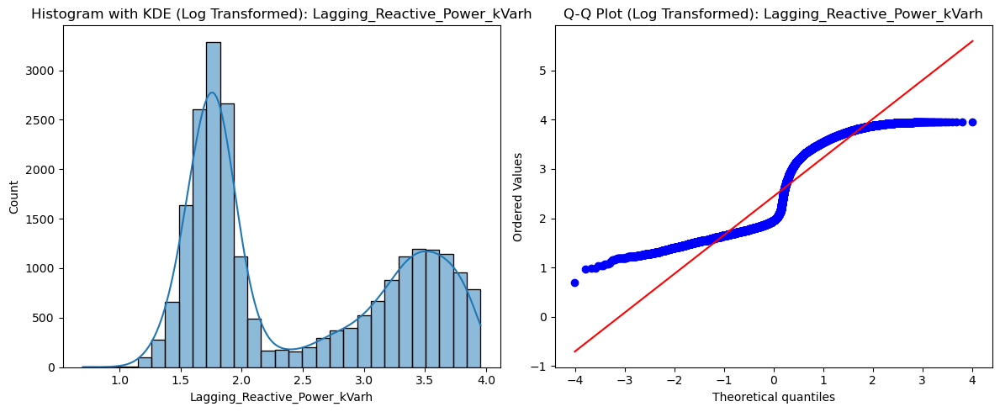

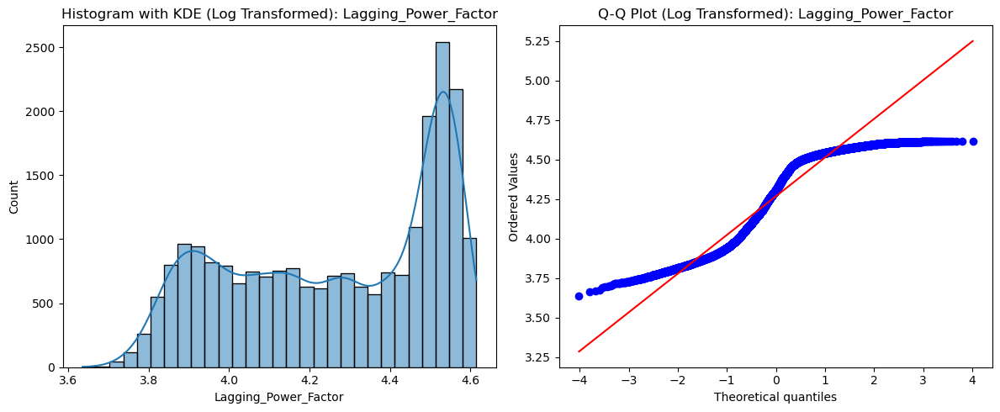

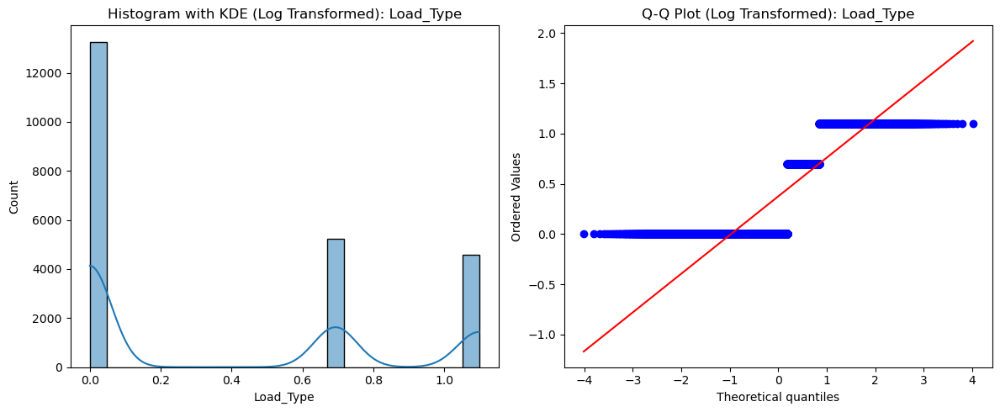

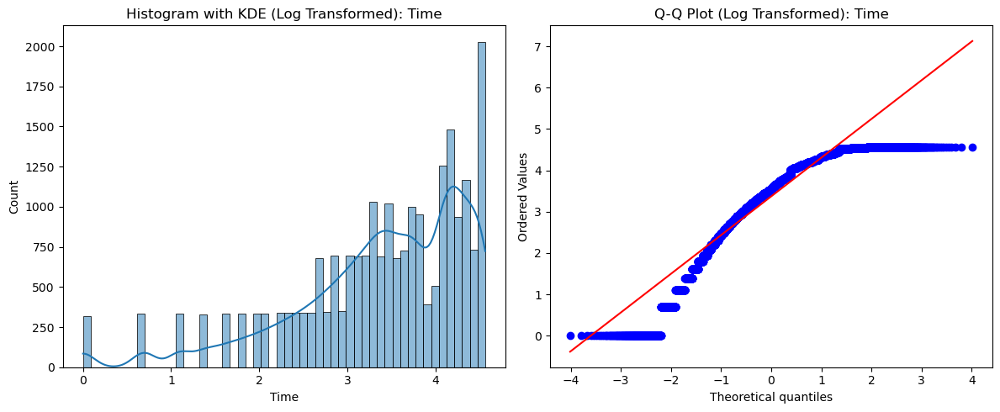

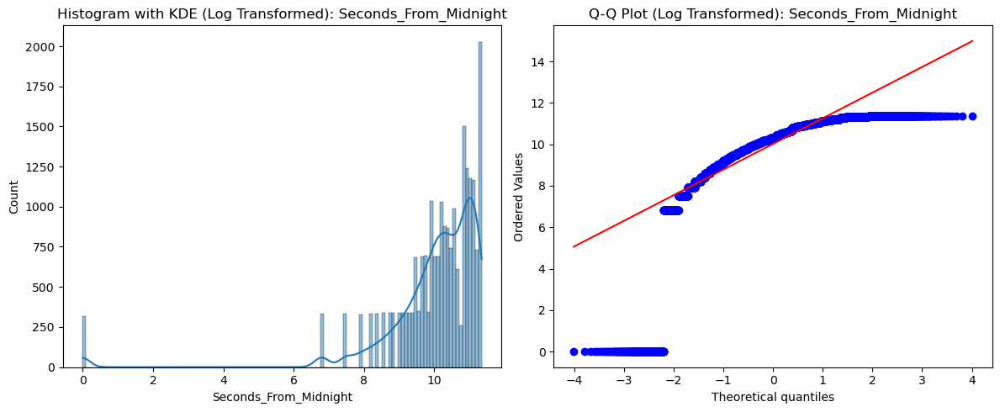

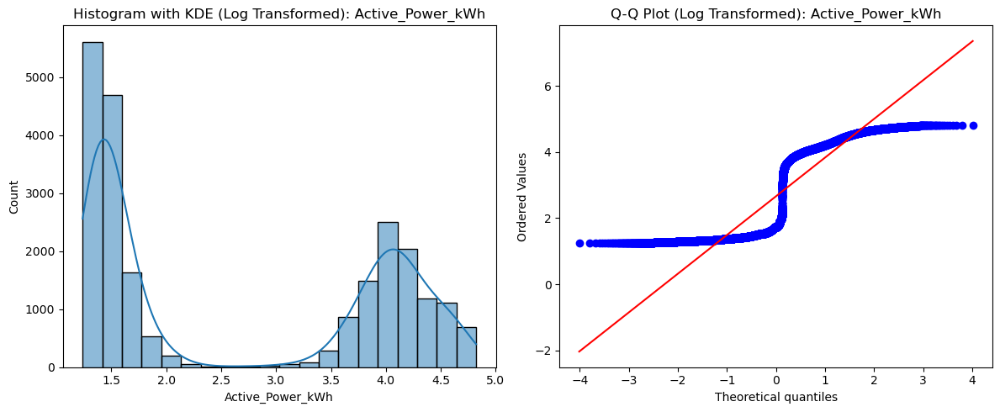

In [385]:
# Apply log transformation to each column
df_new['Active_Power_kWh'] = np.log(df_new['Active_Power_kWh'] + 1)  # Adding 1 to avoid log(0) errors
df_new['Lagging_Power_Factor'] = np.log(df_new['Lagging_Power_Factor'] + 1)
df_new['Load_Type'] = np.log(df_new['Load_Type'] + 1)
df_new['Time'] = np.log(df_new['Time'] + 1)
df_new['Seconds_From_Midnight'] = np.log(df_new['Seconds_From_Midnight'] + 1)
df_new['Lagging_Reactive_Power_kVarh'] = np.log(df_new['Lagging_Reactive_Power_kVarh'] + 1)
# Replot the distributions to check the effect of the log transformation
for column in df_new.columns:
    plt.figure(figsize=(12, 5))
    
    # Histogram with KDE
    plt.subplot(1, 2, 1)
    sns.histplot(df_new[column], kde=True)
    plt.title(f"Histogram with KDE (Log Transformed): {column}")
    
    # Q-Q plot
    plt.subplot(1, 2, 2)
    stats.probplot(df_new[column], dist="norm", plot=plt)
    plt.title(f"Q-Q Plot (Log Transformed): {column}")
    
    plt.tight_layout()
    plt.show()

Separate Training and Testing Sets

In [403]:
X = df_new.drop('Active_Power_kWh', axis=1)
y = df_new['Active_Power_kWh']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(18470, 5)
(18470,)
(4618, 5)
(4618,)


# Model comparison: Lasso, Linear Regression, and Ridge

Scale features for model:

LinearRegression()
Model score: 0.976
Mean Absolute Error :  6.891741949770864
Mean Squared Error :  47.845860331558825
Root Mean Squared Error :  6.917070212999057

-------------------------



c:\Users\U355394\New folder\envs\Lib\site-packages\sklearn\base.py:432: UserWarning:

X has feature names, but LinearRegression was fitted without feature names



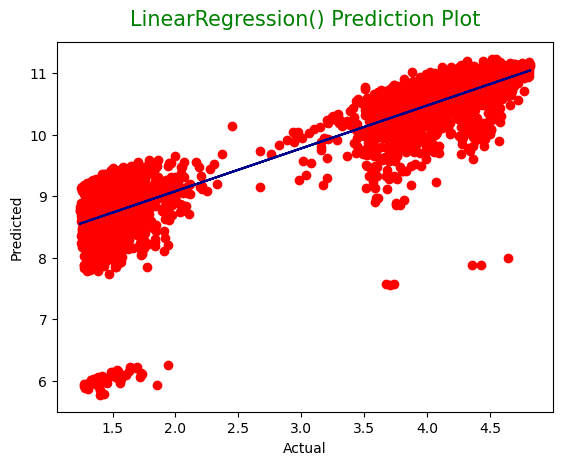

Ridge(alpha=0.5)
Model score: 0.976
Mean Absolute Error :  6.891299118275832
Mean Squared Error :  47.83973679665557
Root Mean Squared Error :  6.916627559487035

-------------------------



c:\Users\U355394\New folder\envs\Lib\site-packages\sklearn\base.py:432: UserWarning:

X has feature names, but Ridge was fitted without feature names



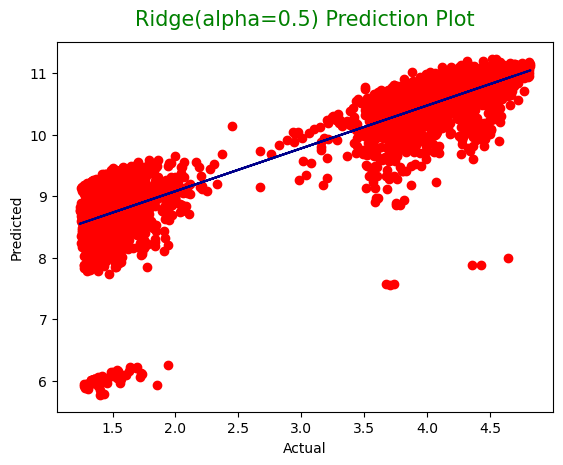

Lasso(alpha=0.5)
Model score: 0.804
Mean Absolute Error :  2.5572746421009667
Mean Squared Error :  7.242006267249285
Root Mean Squared Error :  2.6910975952665273

-------------------------



c:\Users\U355394\New folder\envs\Lib\site-packages\sklearn\base.py:432: UserWarning:

X has feature names, but Lasso was fitted without feature names



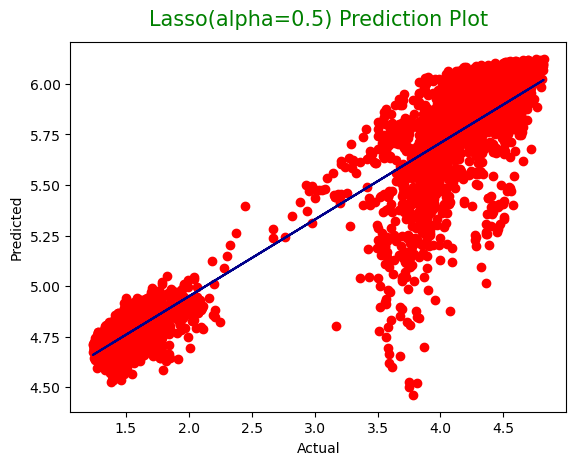

In [423]:
import math
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn import metrics
#Specify Numerical and Categorical Columns for preprocessor 
numerical_features = ['Lagging_Reactive_Power_kVarh', 'Lagging_Power_Factor',
       'Time', 'Seconds_From_Midnight']
passthrough_features = ['Load_Type']

#Prepare preprocessor
preprocessor = make_column_transformer(
    (make_pipeline(StandardScaler()),numerical_features,), 
    ("passthrough", passthrough_features),)
models = []
scores = []
names = [
    "Linear Regression",
    'Ridge',
    'Lasso']

clf = [LinearRegression(),
       Ridge(alpha = 0.5), 
       Lasso(alpha = 0.5)
       ]
for model in clf:
    pipe = make_pipeline(preprocessor, model)
    pipe.fit(X_train, y_train)
    print(model)
    score = pipe.score(X_test, y_test)
    scores.append(score)
    y_pred = model.predict(X_test)
    print("Model score: %.3f" %score)
    #check MAE, MSE and MSE
    print('Mean Absolute Error : ', metrics.mean_absolute_error(y_test, y_pred))
    print('Mean Squared Error : ', metrics.mean_squared_error(y_test, y_pred))
    print('Root Mean Squared Error : ', math.sqrt(metrics.mean_squared_error(y_test, y_pred)))

    print("\n-------------------------\n")
    #visualize model
    x = y_test
    y = y_pred

    plt.title(f"{model} Prediction Plot", fontsize = 15, color = 'g', pad = 12)
    plt.plot(x, y, 'o', color = 'r')

    m, b = np.polyfit(x, y, 1)
    plt.plot(x, m * x + b, color = 'darkblue')
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.show()
 
scores_df = pd.DataFrame(zip(names,scores), columns=['Classifier', 'Accuracy'])